In [1]:
#general data path
DATA_PATH="../data/CC GENERAL.csv"
#simple preprocessing
PROCESSED_DATA_PATH="../data/processed_data.csv"
# log transformation
LOG_TRANSFORMED_DATA="../data/log_transformed_data.csv"
# standard scalar
STANDARD_DATA_PATH="../data/standard_data.csv"
# standard scalar + log transformation
STANDARD_LOG_DATA_PATH="../data/standard_log_data.csv"
# minmax scaling
MINMAXSCALAR_DATA_PATH="../data/minmaxscalar_data.csv"
# Rpboust scaling 
ROBUSTSCALAR_DATA_PATH="../data/Robustscalar_data.csv"
#minmax scaling + log transform
MINMAXSCALAR_LOG_DATA_PATH="../data/minmaxscalar_log_data.csv"
# Rpboust scaling + log transform
ROBUSTSCALAR_LOG_DATA_PATH="../data/Robustscalar_log_data.csv"

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

## 1. Read the dataset

First dowmload the data set from this link https://www.kaggle.com/code/sadkoktaybicici/credit-card-data-clustering-k-mean/data
then import it in python.

In [3]:
#read the data

df = pd.read_csv(DATA_PATH, index_col='CUST_ID' )

print('The shape of the dataset is:', df.shape)

The shape of the dataset is: (8950, 17)


# 2. EDA


in this part you need to check the data quality and assess any issues in the data as:
- null values in each column 
- each column has the proper data type
- outliers
- duplicate rows
- distribution for each column (skewness)
<br>

**comment each issue you find** 

In [4]:
# Let's see the data types and non-null values for each column
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8950 entries, C10001 to C19190
Data columns (total 17 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   BALANCE                           8950 non-null   float64
 1   BALANCE_FREQUENCY                 8950 non-null   float64
 2   PURCHASES                         8950 non-null   float64
 3   ONEOFF_PURCHASES                  8950 non-null   float64
 4   INSTALLMENTS_PURCHASES            8950 non-null   float64
 5   CASH_ADVANCE                      8950 non-null   float64
 6   PURCHASES_FREQUENCY               8950 non-null   float64
 7   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 8   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 9   CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 10  CASH_ADVANCE_TRX                  8950 non-null   int64  
 11  PURCHASES_TRX                     8950 non-null   int64  
 12  CRED

In [5]:
round(df.isnull().sum(axis=0)*100/df.shape[0],2)

BALANCE                             0.00
BALANCE_FREQUENCY                   0.00
PURCHASES                           0.00
ONEOFF_PURCHASES                    0.00
INSTALLMENTS_PURCHASES              0.00
CASH_ADVANCE                        0.00
PURCHASES_FREQUENCY                 0.00
ONEOFF_PURCHASES_FREQUENCY          0.00
PURCHASES_INSTALLMENTS_FREQUENCY    0.00
CASH_ADVANCE_FREQUENCY              0.00
CASH_ADVANCE_TRX                    0.00
PURCHASES_TRX                       0.00
CREDIT_LIMIT                        0.01
PAYMENTS                            0.00
MINIMUM_PAYMENTS                    3.50
PRC_FULL_PAYMENT                    0.00
TENURE                              0.00
dtype: float64

In [6]:
# This will print basic statistics for numerical columns
df.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8949.000000,8950.000000,8637.000000,8950.000000,8950.000000
mean,1564.474828,0.877271,1003.204834,592.437371,411.067645,978.871112,0.490351,0.202458,0.364437,0.135144,3.248827,14.709832,4494.449450,1733.143852,864.206542,0.153715,11.517318
std,2081.531879,0.236904,2136.634782,1659.887917,904.338115,2097.163877,0.401371,0.298336,0.397448,0.200121,6.824647,24.857649,3638.815725,2895.063757,2372.446607,0.292499,1.338331
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
25%,128.281915,0.888889,39.635000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.276166,169.123707,0.000000,12.000000
50%,873.385231,1.000000,361.280000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,856.901546,312.343947,0.000000,12.000000
75%,2054.140036,1.000000,1110.130000,577.405000,468.637500,1113.821139,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.134317,825.485459,0.142857,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


In [7]:
df.head(5)

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
CUST_ID,,,,,,,,,,,,,,,,,
C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


In [8]:
#duplicates
df.drop_duplicates(inplace =True)


In [9]:
df.info()  #no duplicates in the data 

<class 'pandas.core.frame.DataFrame'>
Index: 8950 entries, C10001 to C19190
Data columns (total 17 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   BALANCE                           8950 non-null   float64
 1   BALANCE_FREQUENCY                 8950 non-null   float64
 2   PURCHASES                         8950 non-null   float64
 3   ONEOFF_PURCHASES                  8950 non-null   float64
 4   INSTALLMENTS_PURCHASES            8950 non-null   float64
 5   CASH_ADVANCE                      8950 non-null   float64
 6   PURCHASES_FREQUENCY               8950 non-null   float64
 7   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 8   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 9   CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 10  CASH_ADVANCE_TRX                  8950 non-null   int64  
 11  PURCHASES_TRX                     8950 non-null   int64  
 12  CRED

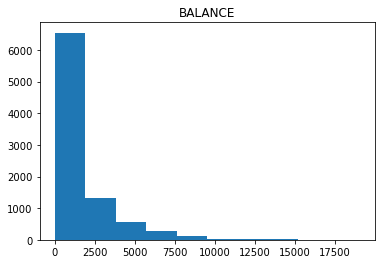

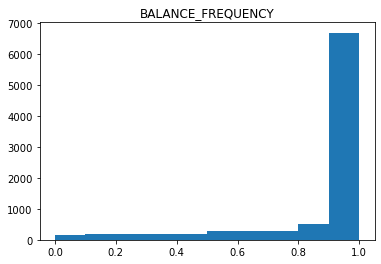

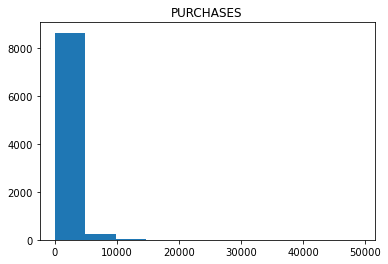

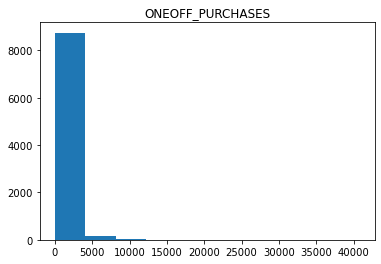

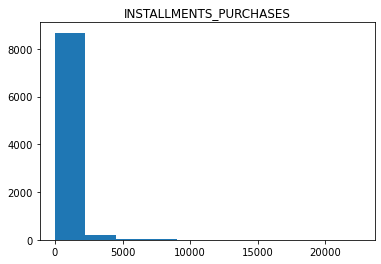

...

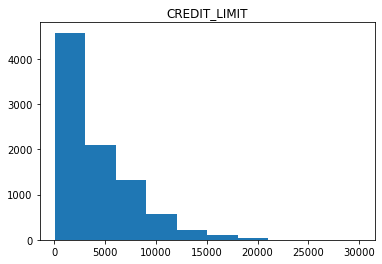

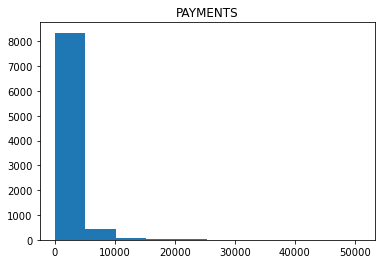

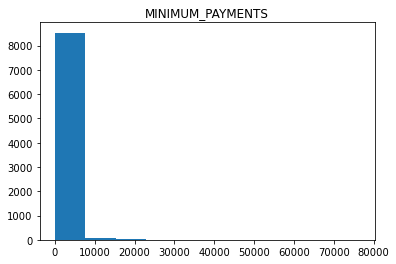

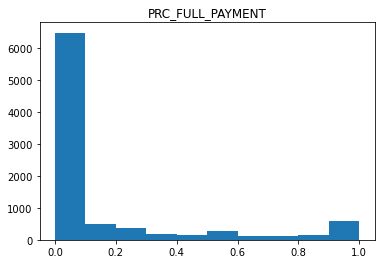

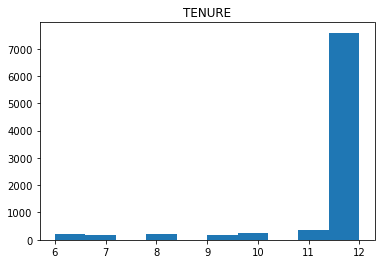

In [10]:
#check skewness

for column in df.columns:
    
    plt.hist(df[column])
    plt.title(column)
    plt.show(column)

In [11]:
#check variance of the data
df.var()

BALANCE                             4.332775e+06
BALANCE_FREQUENCY                   5.612351e-02
PURCHASES                           4.565208e+06
ONEOFF_PURCHASES                    2.755228e+06
INSTALLMENTS_PURCHASES              8.178274e+05
CASH_ADVANCE                        4.398096e+06
PURCHASES_FREQUENCY                 1.610985e-01
ONEOFF_PURCHASES_FREQUENCY          8.900441e-02
PURCHASES_INSTALLMENTS_FREQUENCY    1.579647e-01
CASH_ADVANCE_FREQUENCY              4.004857e-02
CASH_ADVANCE_TRX                    4.657580e+01
PURCHASES_TRX                       6.179027e+02
CREDIT_LIMIT                        1.324098e+07
PAYMENTS                            8.381394e+06
MINIMUM_PAYMENTS                    5.628503e+06
PRC_FULL_PAYMENT                    8.555578e-02
TENURE                              1.791129e+00
dtype: float64

## 3. Data preprocessing

### Define below all the issues that you had found in the previous part
1- there are null values in the data           <br>
2-  the data is skewed so need normalization         <br>


In [12]:
# make a copy for the original dataset
df_copy=df.copy()

**First issue**

Handle the missing values of the numerical columns using median as the data is skewed 

In [13]:
#solution 

for column in df_copy.columns:
    
    if df_copy[column].isnull().sum()!=0:
         df_copy[column].fillna(df_copy[column].median() ,inplace=True)


In [14]:
#test 
df_copy.isnull().sum().sum() #no null values in the data 

0

In [15]:
# save data
df_copy.to_csv(PROCESSED_DATA_PATH, index=False)

**Second issue**

### apply log normalization

In [16]:
#solution 

for column in df_copy.columns:
    if df_copy[column].dtype in ['int64', 'float64']:
        
        df_copy[column] = np.log1p(df_copy[column])
        

In [17]:
#test 
df_copy.var()

BALANCE                              4.053388
BALANCE_FREQUENCY                    0.022079
PURCHASES                            8.508142
ONEOFF_PURCHASES                    10.538886
INSTALLMENTS_PURCHASES               9.504723
CASH_ADVANCE                        12.718484
PURCHASES_FREQUENCY                  0.076905
ONEOFF_PURCHASES_FREQUENCY           0.046947
PURCHASES_INSTALLMENTS_FREQUENCY     0.079441
CASH_ADVANCE_FREQUENCY               0.024560
CASH_ADVANCE_TRX                     1.018720
PURCHASES_TRX                        1.887481
CREDIT_LIMIT                         0.671792
PAYMENTS                             2.533708
MINIMUM_PAYMENTS                     1.368735
PRC_FULL_PAYMENT                     0.044782
TENURE                               0.016996
dtype: float64

In [18]:
df_copy.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000
mean,6.161637,0.619940,4.899647,3.204274,3.352403,3.319086,0.361268,0.158699,0.270072,0.113512,0.817570,1.894731,8.094825,6.624540,5.916079,0.117730,2.519680
std,2.013303,0.148590,2.916872,3.246365,3.082973,3.566298,0.277317,0.216672,0.281852,0.156716,1.009316,1.373856,0.819629,1.591763,1.169929,0.211617,0.130367
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.931826,0.000000,0.018982,0.000000,1.945910
25%,4.861995,0.635989,3.704627,0.000000,0.000000,0.000000,0.080042,0.000000,0.000000,0.000000,0.000000,0.693147,7.378384,5.951361,5.146667,0.000000,2.564949
50%,6.773521,0.693147,5.892417,3.663562,4.499810,0.000000,0.405465,0.080042,0.154151,0.000000,0.000000,2.079442,8.006701,6.754489,5.747301,0.000000,2.564949
75%,7.628099,0.693147,7.013133,6.360274,6.151961,7.016449,0.650588,0.262364,0.559616,0.200671,1.609438,2.890372,8.779711,7.550732,6.671670,0.133531,2.564949
max,9.854515,0.693147,10.800403,10.615512,10.021315,10.760839,0.693147,0.693147,0.693147,0.916291,4.820282,5.883322,10.308986,10.834125,11.243832,0.693147,2.564949


In [19]:
df_copy.to_csv(LOG_TRANSFORMED_DATA, index=False)

## 4. Features transformation

*What is the feature scaling technique that would use and why?* <br>
*return to this section again and try another technique and see how that will impact your result*<br>
for more details on different methods for scaling check these links
- https://scikit-learn.org/stable/modules/preprocessing.html#preprocessing
- https://scikit-learn.org/stable/modules/classes.html#module-sklearn.preprocessing
- https://www.analyticsvidhya.com/blog/2020/07/types-of-feature-transformation-and-scaling/

Answer here:

data contain outliers so standardization would be useful

In [20]:
# processed data without log transformation
processed_data=pd.read_csv(PROCESSED_DATA_PATH)
processed_data.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,312.343947,0.000000,12
4,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


In [21]:
# processed data with log transformation
log_data=pd.read_csv(LOG_TRANSFORMED_DATA)
log_data.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,3.735304,0.597837,4.568506,0.000000,4.568506,0.000000,0.154151,0.000000,0.080042,0.000000,0.000000,1.098612,6.908755,5.312231,4.945277,0.000000,2.564949
1,8.071989,0.646627,0.000000,0.000000,0.000000,8.770896,0.000000,0.000000,0.000000,0.223144,1.609438,0.000000,8.853808,8.319725,6.978531,0.200671,2.564949
2,7.822504,0.693147,6.651791,6.651791,0.000000,0.000000,0.693147,0.693147,0.000000,0.000000,0.000000,2.564949,8.922792,6.434654,6.442994,0.000000,2.564949
3,7.419183,0.492477,7.313220,7.313220,0.000000,5.331694,0.080042,0.080042,0.000000,0.080042,0.693147,0.693147,8.922792,0.000000,5.747301,0.000000,2.564949
4,6.707735,0.693147,2.833213,2.833213,0.000000,0.000000,0.080042,0.080042,0.000000,0.000000,0.000000,0.693147,7.090910,6.521114,5.504483,0.000000,2.564949


## StandardScaler

In [22]:
from sklearn import preprocessing

### Apply for data without log transformation

In [23]:
# create the scalar 
scalar  = preprocessing.StandardScaler()
# Scaled data 
standard_scaled_data = scalar.fit_transform(processed_data)

#create a dataframe
standard_scaled_df = pd.DataFrame(standard_scaled_data , columns=processed_data.columns)
# check with head
standard_scaled_df.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,-0.731989,-0.249434,-0.424900,-0.356934,-0.349079,-0.466786,-0.806490,-0.678661,-0.707313,-0.675349,-0.476070,-0.511333,-0.960378,-0.528979,-0.302400,-0.525551,0.36068
1,0.786961,0.134325,-0.469552,-0.356934,-0.454576,2.605605,-1.221758,-0.678661,-0.916995,0.573963,0.110074,-0.591796,0.688678,0.818642,0.097500,0.234227,0.36068
2,0.447135,0.518084,-0.107668,0.108889,-0.454576,-0.466786,1.269843,2.673451,-0.916995,-0.675349,-0.476070,-0.109020,0.826100,-0.383805,-0.093293,-0.525551,0.36068
3,0.049099,-1.016953,0.232058,0.546189,-0.454576,-0.368653,-1.014125,-0.399319,-0.916995,-0.258913,-0.329534,-0.551565,0.826100,-0.598688,-0.228307,-0.525551,0.36068
4,-0.358775,0.518084,-0.462063,-0.347294,-0.454576,-0.466786,-1.014125,-0.399319,-0.916995,-0.675349,-0.476070,-0.551565,-0.905410,-0.364368,-0.257266,-0.525551,0.36068


In [24]:
standard_scaled_df.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8.950000e+03,8.950000e+03,8.950000e+03,8.950000e+03,8.950000e+03,8.950000e+03,8.950000e+03,8.950000e+03,8.950000e+03,8.950000e+03,8.950000e+03,8.950000e+03,8.950000e+03,8.950000e+03,8.950000e+03,8.950000e+03,8.950000e+03
mean,4.195651e-16,1.209548e-14,-9.278518e-16,3.916048e-15,2.275424e-15,5.697020e-15,-3.716084e-16,2.021052e-15,2.353921e-16,5.856519e-16,-7.151821e-16,-3.570713e-15,6.739178e-15,-3.264056e-16,-4.845286e-17,-2.199184e-15,1.556446e-14
std,1.000056e+00,1.000056e+00,1.000056e+00,1.000056e+00,1.000056e+00,1.000056e+00,1.000056e+00,1.000056e+00,1.000056e+00,1.000056e+00,1.000056e+00,1.000056e+00,1.000056e+00,1.000056e+00,1.000056e+00,1.000056e+00,1.000056e+00
min,-7.516398e-01,-3.703271e+00,-4.695519e-01,-3.569340e-01,-4.545762e-01,-4.667856e-01,-1.221758e+00,-6.786608e-01,-9.169952e-01,-6.753489e-01,-4.760698e-01,-5.917959e-01,-1.221479e+00,-5.986883e-01,-3.621989e-01,-5.255510e-01,-4.122768e+00
25%,-6.900078e-01,4.904486e-02,-4.510006e-01,-3.569340e-01,-4.545762e-01,-4.667856e-01,-1.014125e+00,-6.786608e-01,-9.169952e-01,-6.753489e-01,-4.760698e-01,-5.515646e-01,-7.954727e-01,-4.662913e-01,-2.889613e-01,-5.255510e-01,3.606795e-01
50%,-3.320286e-01,5.180838e-01,-3.004541e-01,-3.340396e-01,-3.561562e-01,-4.667856e-01,2.404259e-02,-3.993193e-01,-4.976286e-01,-6.753489e-01,-4.760698e-01,-3.101767e-01,-4.106928e-01,-3.026846e-01,-2.283069e-01,-5.255510e-01,3.606795e-01
75%,2.352559e-01,5.180838e-01,5.004652e-02,-9.056763e-03,6.366321e-02,6.435242e-02,1.062211e+00,3.269728e-01,9.701506e-01,4.351492e-01,1.100739e-01,9.213645e-02,5.512570e-01,5.802976e-02,-2.408976e-02,-3.712234e-02,3.606795e-01
max,8.397489e+00,5.180838e-01,2.248351e+01,2.420107e+01,2.442689e+01,2.201112e+01,1.269843e+00,2.673451e+00,1.599199e+00,6.820521e+00,1.754785e+01,1.381101e+01,7.010063e+00,1.692228e+01,3.239273e+01,2.893453e+00,3.606795e-01


In [25]:
standard_scaled_df.var()

BALANCE                             1.000112
BALANCE_FREQUENCY                   1.000112
PURCHASES                           1.000112
ONEOFF_PURCHASES                    1.000112
INSTALLMENTS_PURCHASES              1.000112
CASH_ADVANCE                        1.000112
PURCHASES_FREQUENCY                 1.000112
ONEOFF_PURCHASES_FREQUENCY          1.000112
PURCHASES_INSTALLMENTS_FREQUENCY    1.000112
CASH_ADVANCE_FREQUENCY              1.000112
CASH_ADVANCE_TRX                    1.000112
PURCHASES_TRX                       1.000112
CREDIT_LIMIT                        1.000112
PAYMENTS                            1.000112
MINIMUM_PAYMENTS                    1.000112
PRC_FULL_PAYMENT                    1.000112
TENURE                              1.000112
dtype: float64

In [26]:
# save data
standard_scaled_df.to_csv(STANDARD_DATA_PATH, index=False)

### Apply for data with log transformation

In [27]:
# create the scalar 
scalar_log  = preprocessing.StandardScaler()
# Scaled data 
log_standard_scaled_data = scalar_log.fit_transform(log_data)

#create a dataframe
log_standard_scaled_data = pd.DataFrame(log_standard_scaled_data , columns=log_data.columns)
# check with head
log_standard_scaled_data.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,-1.205218,-0.148757,-0.113532,-0.987090,0.394480,-0.930733,-0.746901,-0.732480,-0.674253,-0.724360,-0.810069,-0.579510,-1.447163,-0.824484,-0.829841,-0.556368,0.347262
1,0.948918,0.179616,-1.679855,-0.987090,-1.087454,1.528788,-1.302799,-0.732480,-0.958256,0.699592,0.784603,-1.379210,0.926060,1.065033,0.908184,0.391958,0.347262
2,0.824993,0.492710,0.600727,1.062022,-1.087454,-0.930733,1.196820,2.466762,-0.958256,-0.724360,-0.810069,0.487865,1.010229,-0.119300,0.450407,-0.556368,0.347262
3,0.624653,-0.857867,0.827499,1.265778,-1.087454,0.564372,-1.014151,-0.363042,-0.958256,-0.213583,-0.123281,-0.874655,1.010229,-4.161996,-0.144271,-0.556368,0.347262
4,0.271260,0.492710,-0.708481,-0.114307,-1.087454,-0.930733,-1.014151,-0.363042,-0.958256,-0.724360,-0.810069,-0.874655,-1.224909,-0.064979,-0.351833,-0.556368,0.347262


In [28]:
log_standard_scaled_data.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8.950000e+03,8.950000e+03,8.950000e+03,8.950000e+03,8.950000e+03,8.950000e+03,8.950000e+03,8.950000e+03,8.950000e+03,8.950000e+03,8.950000e+03,8.950000e+03,8.950000e+03,8.950000e+03,8.950000e+03,8.950000e+03,8.950000e+03
mean,-5.844952e-17,3.059961e-15,1.336312e-15,1.040682e-14,-2.529076e-16,-6.843129e-16,3.128472e-17,9.613713e-15,-2.373372e-15,8.603918e-17,-5.562279e-17,-8.813434e-16,1.049576e-14,4.340662e-16,-1.870385e-16,-1.996975e-15,-1.521117e-15
std,1.000056e+00,1.000056e+00,1.000056e+00,1.000056e+00,1.000056e+00,1.000056e+00,1.000056e+00,1.000056e+00,1.000056e+00,1.000056e+00,1.000056e+00,1.000056e+00,1.000056e+00,1.000056e+00,1.000056e+00,1.000056e+00,1.000056e+00
min,-3.060633e+00,-4.172393e+00,-1.679855e+00,-9.870896e-01,-1.087454e+00,-9.307329e-01,-1.302799e+00,-7.324800e-01,-9.582565e-01,-7.243604e-01,-8.100687e-01,-1.379210e+00,-5.079410e+00,-4.161996e+00,-5.040840e+00,-5.563681e-01,-4.401425e+00
25%,-6.455634e-01,1.080159e-01,-4.097152e-01,-9.870896e-01,-1.087454e+00,-9.307329e-01,-1.014151e+00,-7.324800e-01,-9.582565e-01,-7.243604e-01,-8.100687e-01,-8.746552e-01,-8.741531e-01,-4.229376e-01,-6.576937e-01,-5.563681e-01,3.472622e-01
50%,3.039373e-01,4.927100e-01,3.403734e-01,1.414854e-01,3.721960e-01,-9.307329e-01,1.593847e-01,-3.630419e-01,-4.113045e-01,-7.243604e-01,-8.100687e-01,1.344545e-01,-1.075230e-01,8.164312e-02,-1.442709e-01,-5.563681e-01,3.472622e-01
75%,7.284269e-01,4.927100e-01,7.246132e-01,9.722184e-01,9.081215e-01,1.036809e+00,1.043343e+00,4.784703e-01,1.027349e+00,5.561843e-01,7.846025e-01,7.247459e-01,8.356521e-01,5.818980e-01,6.458797e-01,7.467219e-02,3.472622e-01
max,1.834341e+00,4.927100e-01,2.023087e+00,2.283062e+00,2.163264e+00,2.086805e+00,1.196820e+00,2.466762e+00,1.501139e+00,5.122793e+00,3.965987e+00,2.903371e+00,2.701570e+00,2.644753e+00,4.554165e+00,2.719298e+00,3.472622e-01


In [29]:
log_standard_scaled_data.var()

BALANCE                             1.000112
BALANCE_FREQUENCY                   1.000112
PURCHASES                           1.000112
ONEOFF_PURCHASES                    1.000112
INSTALLMENTS_PURCHASES              1.000112
CASH_ADVANCE                        1.000112
PURCHASES_FREQUENCY                 1.000112
ONEOFF_PURCHASES_FREQUENCY          1.000112
PURCHASES_INSTALLMENTS_FREQUENCY    1.000112
CASH_ADVANCE_FREQUENCY              1.000112
CASH_ADVANCE_TRX                    1.000112
PURCHASES_TRX                       1.000112
CREDIT_LIMIT                        1.000112
PAYMENTS                            1.000112
MINIMUM_PAYMENTS                    1.000112
PRC_FULL_PAYMENT                    1.000112
TENURE                              1.000112
dtype: float64

In [30]:
# save data
log_standard_scaled_data.to_csv(STANDARD_LOG_DATA_PATH, index=False)

## MinMax Scalar

### Apply for data without log transformation

In [31]:
# create the scalar 
minmax_scalar  = preprocessing.MinMaxScaler() 
# Scaled data 
data_minmax_scaled = minmax_scalar.fit_transform(processed_data)

#create a dataframe
minmax_scaled_df = pd.DataFrame(data_minmax_scaled , columns=processed_data.columns)
# check with head
minmax_scaled_df.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,0.002148,0.818182,0.001945,0.000000,0.00424,0.000000,0.166667,0.000000,0.083333,0.000000,0.00000,0.005587,0.031720,0.003979,0.001826,0.000000,1.0
1,0.168169,0.909091,0.000000,0.000000,0.00000,0.136685,0.000000,0.000000,0.000000,0.166667,0.03252,0.000000,0.232053,0.080893,0.014034,0.222222,1.0
2,0.131026,1.000000,0.015766,0.018968,0.00000,0.000000,1.000000,1.000000,0.000000,0.000000,0.00000,0.033520,0.248748,0.012264,0.008210,0.000000,1.0
3,0.087521,0.636364,0.030567,0.036775,0.00000,0.004366,0.083333,0.083333,0.000000,0.055555,0.00813,0.002793,0.248748,0.000000,0.004088,0.000000,1.0
4,0.042940,1.000000,0.000326,0.000393,0.00000,0.000000,0.083333,0.083333,0.000000,0.000000,0.00000,0.002793,0.038397,0.013374,0.003204,0.000000,1.0


In [32]:
minmax_scaled_df.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000
mean,0.082154,0.877271,0.020457,0.014534,0.018270,0.020766,0.490351,0.202458,0.364437,0.090096,0.026413,0.041089,0.148390,0.034170,0.011058,0.153715,0.919553
std,0.109306,0.236904,0.043570,0.040722,0.040193,0.044491,0.401371,0.298336,0.397448,0.133414,0.055485,0.069435,0.121491,0.057078,0.030531,0.292499,0.223055
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.006736,0.888889,0.000808,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,0.002793,0.051753,0.007556,0.002236,0.000000,1.000000
50%,0.045864,1.000000,0.007367,0.000932,0.003956,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,0.019553,0.098497,0.016894,0.004088,0.000000,1.000000
75%,0.107868,1.000000,0.022637,0.014166,0.020828,0.023629,0.916667,0.300000,0.750000,0.148148,0.032520,0.047486,0.215359,0.037482,0.010322,0.142857,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [33]:
minmax_scaled_df.var()

BALANCE                             0.011948
BALANCE_FREQUENCY                   0.056124
PURCHASES                           0.001898
ONEOFF_PURCHASES                    0.001658
INSTALLMENTS_PURCHASES              0.001615
CASH_ADVANCE                        0.001979
PURCHASES_FREQUENCY                 0.161098
ONEOFF_PURCHASES_FREQUENCY          0.089004
PURCHASES_INSTALLMENTS_FREQUENCY    0.157965
CASH_ADVANCE_FREQUENCY              0.017799
CASH_ADVANCE_TRX                    0.003079
PURCHASES_TRX                       0.004821
CREDIT_LIMIT                        0.014760
PAYMENTS                            0.003258
MINIMUM_PAYMENTS                    0.000932
PRC_FULL_PAYMENT                    0.085556
TENURE                              0.049754
dtype: float64

In [34]:
# save data
minmax_scaled_df.to_csv(MINMAXSCALAR_DATA_PATH, index=False)

### Apply for data with log transformation

In [35]:
# create the scalar 
minmax_scalar  = preprocessing.MinMaxScaler() 
# Scaled data 
log_data_minmax_scaled = minmax_scalar.fit_transform(log_data)

#create a dataframe
minmax_scaled_log_df = pd.DataFrame(log_data_minmax_scaled , columns=log_data.columns)
# check with head
minmax_scaled_log_df.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,0.379045,0.862497,0.422994,0.000000,0.455879,0.000000,0.222393,0.000000,0.115477,0.000000,0.000000,0.186733,0.466811,0.490324,0.438874,0.000000,1.0
1,0.819116,0.932886,0.000000,0.000000,0.000000,0.815075,0.000000,0.000000,0.000000,0.243529,0.333889,0.000000,0.771814,0.767919,0.620013,0.289506,1.0
2,0.793799,1.000000,0.615884,0.626611,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.435970,0.782631,0.593925,0.572303,0.000000,1.0
3,0.752871,0.710494,0.677125,0.688918,0.000000,0.495472,0.115477,0.115477,0.000000,0.087355,0.143798,0.117816,0.782631,0.000000,0.510325,0.000000,1.0
4,0.680676,1.000000,0.262325,0.266894,0.000000,0.000000,0.115477,0.115477,0.000000,0.000000,0.000000,0.117816,0.495375,0.601905,0.488693,0.000000,1.0


In [36]:
minmax_scaled_log_df.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000
mean,0.625260,0.894384,0.453654,0.301848,0.334527,0.308441,0.521199,0.228954,0.389631,0.123883,0.169610,0.322051,0.652798,0.611451,0.525361,0.169849,0.926872
std,0.204303,0.214369,0.270071,0.305813,0.307642,0.331415,0.400083,0.312592,0.406627,0.171033,0.209390,0.233517,0.128526,0.146921,0.104227,0.305299,0.210596
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.493377,0.917538,0.343008,0.000000,0.000000,0.000000,0.115477,0.000000,0.000000,0.000000,0.000000,0.117816,0.540453,0.549316,0.456815,0.000000,1.000000
50%,0.687352,1.000000,0.545574,0.345114,0.449024,0.000000,0.584963,0.115477,0.222393,0.000000,0.000000,0.353447,0.638980,0.623446,0.510325,0.000000,1.000000
75%,0.774072,1.000000,0.649340,0.599149,0.613888,0.652036,0.938600,0.378512,0.807355,0.219003,0.333889,0.491282,0.760195,0.696940,0.592675,0.192645,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [37]:
minmax_scaled_log_df.var()

BALANCE                             0.041740
BALANCE_FREQUENCY                   0.045954
PURCHASES                           0.072938
ONEOFF_PURCHASES                    0.093522
INSTALLMENTS_PURCHASES              0.094643
CASH_ADVANCE                        0.109836
PURCHASES_FREQUENCY                 0.160067
ONEOFF_PURCHASES_FREQUENCY          0.097713
PURCHASES_INSTALLMENTS_FREQUENCY    0.165345
CASH_ADVANCE_FREQUENCY              0.029252
CASH_ADVANCE_TRX                    0.043844
PURCHASES_TRX                       0.054530
CREDIT_LIMIT                        0.016519
PAYMENTS                            0.021586
MINIMUM_PAYMENTS                    0.010863
PRC_FULL_PAYMENT                    0.093207
TENURE                              0.044351
dtype: float64

In [38]:
minmax_scaled_log_df.to_csv(MINMAXSCALAR_LOG_DATA_PATH, index=False)

## Robust Scalar

### Apply for data without log transformation

In [39]:
# create the scalar 
Robust_scalar  = preprocessing.RobustScaler()
# Scaled data 
data_Robust_scaled = Robust_scalar.fit_transform(processed_data)

#create a dataframe
Robust_scaled_df = pd.DataFrame(data_Robust_scaled , columns=processed_data.columns)
# check with head
Robust_scaled_df.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,-0.432267,-1.636364,-0.248371,-0.065812,0.013657,0.000000,-0.399999,-0.277777,-0.111112,0.000000,0.00,-0.3125,-0.408163,-0.431595,-0.279732,0.000000,0.0
1,1.209374,-0.818182,-0.337489,-0.065812,-0.189912,5.784542,-0.600000,-0.277777,-0.222223,1.125001,1.00,-0.4375,0.816327,2.138626,1.230054,1.555556,0.0
2,0.842099,0.000000,0.384766,1.273231,-0.189912,0.000000,0.600000,3.055557,-0.222223,0.000000,0.00,0.3125,0.918367,-0.154715,0.509732,0.000000,0.0
3,0.411913,-3.272727,1.062798,2.530286,-0.189912,0.184759,-0.500000,0.000000,-0.222223,0.374999,0.25,-0.3750,0.918367,-0.564547,0.000000,0.000000,0.0
4,-0.028907,0.000000,-0.322542,-0.038102,-0.189912,0.000000,-0.500000,0.000000,-0.222223,0.000000,0.00,-0.3750,-0.367347,-0.117644,-0.109334,0.000000,0.0


In [40]:
Robust_scaled_df.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8.950000e+03,8950.000000,8.950000e+03,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8.950000e+03,8950.000000,8950.000000,8950.000000
mean,3.588476e-01,-1.104565,5.996523e-01,0.960223,0.687243,0.878840,-0.011579,0.397082,0.263694,0.608150,0.812207,0.481865,0.304956,5.772887e-01,0.861953,1.076004,-0.482682
std,1.080833e+00,2.132138,1.995932e+00,2.874738,1.929718,1.882855,0.481645,0.994454,0.529930,0.900547,1.706162,1.553603,0.742581,1.907335e+00,3.775626,2.047496,1.338331
min,-4.535045e-01,-9.000009,-3.374887e-01,-0.065812,-0.189912,0.000000,-0.600000,-0.277777,-0.222223,0.000000,0.000000,-0.437500,-0.602041,-5.645465e-01,-0.505498,0.000000,-6.000000
25%,-3.868942e-01,-1.000000,-3.004638e-01,-0.065812,-0.189912,0.000000,-0.500000,-0.277777,-0.222223,0.000000,0.000000,-0.375000,-0.285714,-3.120353e-01,-0.228996,0.000000,0.000000
50%,2.951740e-17,0.000000,2.653585e-17,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-3.744563e-17,0.000000,0.000000,0.000000
75%,6.131058e-01,0.000000,6.995362e-01,0.934188,0.810088,1.000000,0.500000,0.722223,0.777777,1.000000,1.000000,0.625000,0.714286,6.879647e-01,0.771004,1.000000,0.000000
max,9.434627e+00,0.000000,4.547269e+01,70.528052,47.821611,42.320270,0.600000,3.055557,1.111111,6.750007,30.750000,21.937500,5.510204,3.285194e+01,123.157957,7.000007,0.000000


In [41]:
Robust_scaled_df.var()

BALANCE                              1.168201
BALANCE_FREQUENCY                    4.546013
PURCHASES                            3.983743
ONEOFF_PURCHASES                     8.264117
INSTALLMENTS_PURCHASES               3.723811
CASH_ADVANCE                         3.545144
PURCHASES_FREQUENCY                  0.231981
ONEOFF_PURCHASES_FREQUENCY           0.988938
PURCHASES_INSTALLMENTS_FREQUENCY     0.280826
CASH_ADVANCE_FREQUENCY               0.810985
CASH_ADVANCE_TRX                     2.910988
PURCHASES_TRX                        2.413682
CREDIT_LIMIT                         0.551426
PAYMENTS                             3.637926
MINIMUM_PAYMENTS                    14.255348
PRC_FULL_PAYMENT                     4.192242
TENURE                               1.791129
dtype: float64

In [42]:
# save data
Robust_scaled_df.to_csv(ROBUSTSCALAR_DATA_PATH, index=False)

### Apply for data with log transformation

In [43]:
# create the scalar 
Robust_scalar  = preprocessing.RobustScaler()
# Scaled data 
log_data_Robust_scaled = Robust_scalar.fit_transform(log_data)

#create a dataframe
Log_Robust_scaled_df = pd.DataFrame(log_data_Robust_scaled , columns=log_data.columns)
# check with head
Log_Robust_scaled_df.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,-1.098374,-1.667474,-0.400154,-0.576007,0.011167,0.000000,-0.440481,-0.305081,-0.132428,0.000000,0.000000,-0.446395,-0.783504,-0.901767,-0.525916,0.000000,0.0
1,0.469421,-0.813879,-1.780990,-0.576007,-0.731443,1.250048,-0.710662,-0.305081,-0.275459,1.111990,1.000000,-0.946395,0.604504,0.978658,0.807362,1.502798,0.0
2,0.379228,0.000000,0.229522,0.469827,-0.731443,0.000000,0.504223,2.336846,-0.275459,0.000000,0.000000,0.220964,0.653731,-0.199976,0.456190,0.000000,0.0
3,0.233419,-3.510781,0.429440,0.573821,-0.731443,0.759885,-0.570371,0.000000,-0.275459,0.398875,0.430677,-0.630930,0.653731,-4.223218,0.000000,0.000000,0.0
4,-0.023783,0.000000,-0.924648,-0.130552,-0.731443,0.000000,-0.570371,0.000000,-0.275459,0.000000,0.000000,-0.630930,-0.653517,-0.145917,-0.159225,0.000000,0.0


In [44]:
Log_Robust_scaled_df.var()

BALANCE                             0.529763
BALANCE_FREQUENCY                   6.757988
PURCHASES                           0.777268
ONEOFF_PURCHASES                    0.260521
INSTALLMENTS_PURCHASES              0.251138
CASH_ADVANCE                        0.258345
PURCHASES_FREQUENCY                 0.236250
ONEOFF_PURCHASES_FREQUENCY          0.682018
PURCHASES_INSTALLMENTS_FREQUENCY    0.253666
CASH_ADVANCE_FREQUENCY              0.609901
CASH_ADVANCE_TRX                    0.393284
PURCHASES_TRX                       0.390961
CREDIT_LIMIT                        0.342102
PAYMENTS                            0.990509
MINIMUM_PAYMENTS                    0.588542
PRC_FULL_PAYMENT                    2.511507
TENURE                              0.016996
dtype: float64

In [45]:
Log_Robust_scaled_df.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950.000000,8950.000000,8.950000e+03,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000
mean,-0.221208,-1.280784,-3.000660e-01,-0.072212,-0.186511,0.473044,-0.077465,0.299799,0.207143,0.565666,0.507985,-0.084066,0.062886,-0.081250,0.110673,0.881668,-0.045269
std,0.727848,2.599613,8.816282e-01,0.510413,0.501137,0.508277,0.486055,0.825844,0.503653,0.780961,0.627124,0.625269,0.584895,0.995243,0.767165,1.584773,0.130367
min,-2.448759,-12.126787,-1.780990e+00,-0.576007,-0.731443,0.000000,-0.710662,-0.305081,-0.275459,0.000000,0.000000,-0.946395,-2.907868,-4.223218,-3.756266,0.000000,-0.619039
25%,-0.691053,-1.000000,-6.612623e-01,-0.576007,-0.731443,0.000000,-0.570371,-0.305081,-0.275459,0.000000,0.000000,-0.630930,-0.448373,-0.502153,-0.393858,0.000000,0.000000
50%,0.000000,0.000000,1.342242e-16,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.308947,0.000000,3.387377e-01,0.423993,0.268557,1.000000,0.429629,0.694919,0.724541,1.000000,1.000000,0.369070,0.551627,0.497847,0.606142,1.000000,0.000000
max,1.113839,0.000000,1.483445e+00,1.093027,0.897520,1.533659,0.504223,2.336846,0.963154,4.566145,2.995009,1.731221,1.642931,2.550776,3.604274,5.190898,0.000000


In [46]:
Log_Robust_scaled_df.to_csv(ROBUSTSCALAR_LOG_DATA_PATH,index=False)

# 5. visualize using TSNE

In [47]:
from sklearn.manifold import TSNE
import plotly.express as px

## visualize processed data

In [48]:
process_data=pd.read_csv(PROCESSED_DATA_PATH )
process_data.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,312.343947,0.000000,12
4,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


In [49]:
tsne=TSNE(n_components=2,perplexity=30, verbose=1, n_iter=300 )

In [50]:
processed_tsne_projection= tsne.fit_transform(process_data)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 8950 samples in 0.001s...
[t-SNE] Computed neighbors for 8950 samples in 8.607s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8950
[t-SNE] Computed conditional probabilities for sample 2000 / 8950
[t-SNE] Computed conditional probabilities for sample 3000 / 8950
[t-SNE] Computed conditional probabilities for sample 4000 / 8950
[t-SNE] Computed conditional probabilities for sample 5000 / 8950
[t-SNE] Computed conditional probabilities for sample 6000 / 8950
[t-SNE] Computed conditional probabilities for sample 7000 / 8950
[t-SNE] Computed conditional probabilities for sample 8000 / 8950
[t-SNE] Computed conditional probabilities for sample 8950 / 8950
[t-SNE] Mean sigma: 84.766948
[t-SNE] KL divergence after 250 iterations with early exaggeration: 79.804672
[t-SNE] KL divergence after 300 iterations: 2.570301


In [51]:
processed_tsne_projection = pd.DataFrame(processed_tsne_projection, index=process_data.index)
processed_tsne_projection.shape

(8950, 2)

In [52]:
fig=px.scatter(x=processed_tsne_projection[0], y=processed_tsne_projection[1])
fig.update_layout( title_text='Simple processing')
fig.show()

# Log transformation

In [53]:
log_transformed_data=pd.read_csv(LOG_TRANSFORMED_DATA )
log_transformed_data.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,3.735304,0.597837,4.568506,0.000000,4.568506,0.000000,0.154151,0.000000,0.080042,0.000000,0.000000,1.098612,6.908755,5.312231,4.945277,0.000000,2.564949
1,8.071989,0.646627,0.000000,0.000000,0.000000,8.770896,0.000000,0.000000,0.000000,0.223144,1.609438,0.000000,8.853808,8.319725,6.978531,0.200671,2.564949
2,7.822504,0.693147,6.651791,6.651791,0.000000,0.000000,0.693147,0.693147,0.000000,0.000000,0.000000,2.564949,8.922792,6.434654,6.442994,0.000000,2.564949
3,7.419183,0.492477,7.313220,7.313220,0.000000,5.331694,0.080042,0.080042,0.000000,0.080042,0.693147,0.693147,8.922792,0.000000,5.747301,0.000000,2.564949
4,6.707735,0.693147,2.833213,2.833213,0.000000,0.000000,0.080042,0.080042,0.000000,0.000000,0.000000,0.693147,7.090910,6.521114,5.504483,0.000000,2.564949


In [54]:
# visualize with TSNE
tsne_log=TSNE(n_components=2,perplexity=30, verbose=1, n_iter=300 )


In [55]:
tsne_log_projection= tsne_log.fit_transform(log_transformed_data)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 8950 samples in 0.000s...
[t-SNE] Computed neighbors for 8950 samples in 7.423s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8950
[t-SNE] Computed conditional probabilities for sample 2000 / 8950
[t-SNE] Computed conditional probabilities for sample 3000 / 8950
[t-SNE] Computed conditional probabilities for sample 4000 / 8950
[t-SNE] Computed conditional probabilities for sample 5000 / 8950
[t-SNE] Computed conditional probabilities for sample 6000 / 8950
[t-SNE] Computed conditional probabilities for sample 7000 / 8950
[t-SNE] Computed conditional probabilities for sample 8000 / 8950
[t-SNE] Computed conditional probabilities for sample 8950 / 8950
[t-SNE] Mean sigma: 0.659467
[t-SNE] KL divergence after 250 iterations with early exaggeration: 71.710922
[t-SNE] KL divergence after 300 iterations: 2.434075


In [56]:
tsne_log_projection= pd.DataFrame(tsne_log_projection, index=log_transformed_data.index)
tsne_log_projection.shape

(8950, 2)

In [57]:
fig=px.scatter(x=tsne_log_projection[0], y=tsne_log_projection[1])
fig.update_traces(textposition='top center')
fig.update_layout( title_text='Log Transform')
fig.show()

# Standard Scalar

In [58]:
standard_scalar_data=pd.read_csv(STANDARD_DATA_PATH )
standard_scalar_data.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,-0.731989,-0.249434,-0.424900,-0.356934,-0.349079,-0.466786,-0.806490,-0.678661,-0.707313,-0.675349,-0.476070,-0.511333,-0.960378,-0.528979,-0.302400,-0.525551,0.36068
1,0.786961,0.134325,-0.469552,-0.356934,-0.454576,2.605605,-1.221758,-0.678661,-0.916995,0.573963,0.110074,-0.591796,0.688678,0.818642,0.097500,0.234227,0.36068
2,0.447135,0.518084,-0.107668,0.108889,-0.454576,-0.466786,1.269843,2.673451,-0.916995,-0.675349,-0.476070,-0.109020,0.826100,-0.383805,-0.093293,-0.525551,0.36068
3,0.049099,-1.016953,0.232058,0.546189,-0.454576,-0.368653,-1.014125,-0.399319,-0.916995,-0.258913,-0.329534,-0.551565,0.826100,-0.598688,-0.228307,-0.525551,0.36068
4,-0.358775,0.518084,-0.462063,-0.347294,-0.454576,-0.466786,-1.014125,-0.399319,-0.916995,-0.675349,-0.476070,-0.551565,-0.905410,-0.364368,-0.257266,-0.525551,0.36068


In [59]:
# visualize with TSNE
tsne_stand=TSNE(n_components=2,perplexity=30, verbose=1, n_iter=300 )


In [60]:
tsne_stand_projection= tsne_stand.fit_transform(standard_scalar_data)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 8950 samples in 0.003s...
[t-SNE] Computed neighbors for 8950 samples in 5.910s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8950
[t-SNE] Computed conditional probabilities for sample 2000 / 8950
[t-SNE] Computed conditional probabilities for sample 3000 / 8950
[t-SNE] Computed conditional probabilities for sample 4000 / 8950
[t-SNE] Computed conditional probabilities for sample 5000 / 8950
[t-SNE] Computed conditional probabilities for sample 6000 / 8950
[t-SNE] Computed conditional probabilities for sample 7000 / 8950
[t-SNE] Computed conditional probabilities for sample 8000 / 8950
[t-SNE] Computed conditional probabilities for sample 8950 / 8950
[t-SNE] Mean sigma: 0.426669
[t-SNE] KL divergence after 250 iterations with early exaggeration: 83.966270
[t-SNE] KL divergence after 300 iterations: 2.710248


In [61]:
tsne_stand_projection= pd.DataFrame(tsne_stand_projection, index=standard_scalar_data.index)
tsne_stand_projection.shape

(8950, 2)

In [62]:
fig=px.scatter(x=tsne_stand_projection[0], y=tsne_stand_projection[1])
fig.update_traces(textposition='top center')
fig.update_layout( title_text='Standard Scalar')
fig.show()

## StandaraScalar + Log transform

In [63]:
normalized_data=pd.read_csv(STANDARD_LOG_DATA_PATH )
normalized_data.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,-1.205218,-0.148757,-0.113532,-0.987090,0.394480,-0.930733,-0.746901,-0.732480,-0.674253,-0.724360,-0.810069,-0.579510,-1.447163,-0.824484,-0.829841,-0.556368,0.347262
1,0.948918,0.179616,-1.679855,-0.987090,-1.087454,1.528788,-1.302799,-0.732480,-0.958256,0.699592,0.784603,-1.379210,0.926060,1.065033,0.908184,0.391958,0.347262
2,0.824993,0.492710,0.600727,1.062022,-1.087454,-0.930733,1.196820,2.466762,-0.958256,-0.724360,-0.810069,0.487865,1.010229,-0.119300,0.450407,-0.556368,0.347262
3,0.624653,-0.857867,0.827499,1.265778,-1.087454,0.564372,-1.014151,-0.363042,-0.958256,-0.213583,-0.123281,-0.874655,1.010229,-4.161996,-0.144271,-0.556368,0.347262
4,0.271260,0.492710,-0.708481,-0.114307,-1.087454,-0.930733,-1.014151,-0.363042,-0.958256,-0.724360,-0.810069,-0.874655,-1.224909,-0.064979,-0.351833,-0.556368,0.347262


In [64]:
# visualize with TSNE
tsne_normalized=TSNE(n_components=2,perplexity=30, verbose=1, n_iter=300 )


In [65]:
tsne_normalized_projection= tsne_normalized.fit_transform(normalized_data)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 8950 samples in 0.001s...
[t-SNE] Computed neighbors for 8950 samples in 5.273s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8950
[t-SNE] Computed conditional probabilities for sample 2000 / 8950
[t-SNE] Computed conditional probabilities for sample 3000 / 8950
[t-SNE] Computed conditional probabilities for sample 4000 / 8950
[t-SNE] Computed conditional probabilities for sample 5000 / 8950
[t-SNE] Computed conditional probabilities for sample 6000 / 8950
[t-SNE] Computed conditional probabilities for sample 7000 / 8950
[t-SNE] Computed conditional probabilities for sample 8000 / 8950
[t-SNE] Computed conditional probabilities for sample 8950 / 8950
[t-SNE] Mean sigma: 0.631925
[t-SNE] KL divergence after 250 iterations with early exaggeration: 77.719872
[t-SNE] KL divergence after 300 iterations: 2.578320


In [66]:
tsne_normalized_projection= pd.DataFrame(tsne_normalized_projection, index=normalized_data.index)
tsne_normalized_projection.shape

(8950, 2)

In [67]:
fig=px.scatter(x=tsne_normalized_projection[0], y=tsne_normalized_projection[1])
fig.update_traces(textposition='top center')
fig.update_layout( title_text='Standard Scalar + Log transform')
fig.show()

# MinMax Scalar

In [68]:
min_max_data=pd.read_csv(MINMAXSCALAR_DATA_PATH )
min_max_data.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,0.002148,0.818182,0.001945,0.000000,0.00424,0.000000,0.166667,0.000000,0.083333,0.000000,0.00000,0.005587,0.031720,0.003979,0.001826,0.000000,1.0
1,0.168169,0.909091,0.000000,0.000000,0.00000,0.136685,0.000000,0.000000,0.000000,0.166667,0.03252,0.000000,0.232053,0.080893,0.014034,0.222222,1.0
2,0.131026,1.000000,0.015766,0.018968,0.00000,0.000000,1.000000,1.000000,0.000000,0.000000,0.00000,0.033520,0.248748,0.012264,0.008210,0.000000,1.0
3,0.087521,0.636364,0.030567,0.036775,0.00000,0.004366,0.083333,0.083333,0.000000,0.055555,0.00813,0.002793,0.248748,0.000000,0.004088,0.000000,1.0
4,0.042940,1.000000,0.000326,0.000393,0.00000,0.000000,0.083333,0.083333,0.000000,0.000000,0.00000,0.002793,0.038397,0.013374,0.003204,0.000000,1.0


In [69]:
# visualize with TSNE
tsne_minmax=TSNE(n_components=2,perplexity=30, verbose=1, n_iter=300 )


In [70]:
tsne_minmax_projection= tsne_minmax.fit_transform(min_max_data)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 8950 samples in 0.001s...
[t-SNE] Computed neighbors for 8950 samples in 7.039s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8950
[t-SNE] Computed conditional probabilities for sample 2000 / 8950
[t-SNE] Computed conditional probabilities for sample 3000 / 8950
[t-SNE] Computed conditional probabilities for sample 4000 / 8950
[t-SNE] Computed conditional probabilities for sample 5000 / 8950
[t-SNE] Computed conditional probabilities for sample 6000 / 8950
[t-SNE] Computed conditional probabilities for sample 7000 / 8950
[t-SNE] Computed conditional probabilities for sample 8000 / 8950
[t-SNE] Computed conditional probabilities for sample 8950 / 8950
[t-SNE] Mean sigma: 0.049584
[t-SNE] KL divergence after 250 iterations with early exaggeration: 78.451797
[t-SNE] KL divergence after 300 iterations: 2.499101


In [71]:
tsne_minmax_projection= pd.DataFrame(tsne_minmax_projection, index=min_max_data.index)
tsne_minmax_projection.shape

(8950, 2)

In [72]:
fig=px.scatter(x=tsne_minmax_projection[0], y=tsne_minmax_projection[1])
fig.update_traces(textposition='top center')
fig.update_layout( title_text='MinMaxScaling')
fig.show()

## MinMax Scaling + log Transform

In [73]:
min_max_log_data=pd.read_csv(MINMAXSCALAR_LOG_DATA_PATH )
min_max_log_data.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,0.379045,0.862497,0.422994,0.000000,0.455879,0.000000,0.222393,0.000000,0.115477,0.000000,0.000000,0.186733,0.466811,0.490324,0.438874,0.000000,1.0
1,0.819116,0.932886,0.000000,0.000000,0.000000,0.815075,0.000000,0.000000,0.000000,0.243529,0.333889,0.000000,0.771814,0.767919,0.620013,0.289506,1.0
2,0.793799,1.000000,0.615884,0.626611,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.435970,0.782631,0.593925,0.572303,0.000000,1.0
3,0.752871,0.710494,0.677125,0.688918,0.000000,0.495472,0.115477,0.115477,0.000000,0.087355,0.143798,0.117816,0.782631,0.000000,0.510325,0.000000,1.0
4,0.680676,1.000000,0.262325,0.266894,0.000000,0.000000,0.115477,0.115477,0.000000,0.000000,0.000000,0.117816,0.495375,0.601905,0.488693,0.000000,1.0


In [74]:
# visualize with TSNE
tsne_minmax_log=TSNE(n_components=2,perplexity=30, verbose=1, n_iter=300 )


In [75]:
tsne_minmax_log_projection= tsne_minmax_log.fit_transform(min_max_log_data)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 8950 samples in 0.001s...
[t-SNE] Computed neighbors for 8950 samples in 14.094s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8950
[t-SNE] Computed conditional probabilities for sample 2000 / 8950
[t-SNE] Computed conditional probabilities for sample 3000 / 8950
[t-SNE] Computed conditional probabilities for sample 4000 / 8950
[t-SNE] Computed conditional probabilities for sample 5000 / 8950
[t-SNE] Computed conditional probabilities for sample 6000 / 8950
[t-SNE] Computed conditional probabilities for sample 7000 / 8950
[t-SNE] Computed conditional probabilities for sample 8000 / 8950
[t-SNE] Computed conditional probabilities for sample 8950 / 8950
[t-SNE] Mean sigma: 0.125618
[t-SNE] KL divergence after 250 iterations with early exaggeration: 73.127174
[t-SNE] KL divergence after 300 iterations: 2.443820


In [76]:
tsne_minmax_log_projection= pd.DataFrame(tsne_minmax_log_projection, index=min_max_log_data.index)
tsne_minmax_log_projection.shape

(8950, 2)

In [77]:
fig=px.scatter(x=tsne_minmax_log_projection[0], y=tsne_minmax_log_projection[1])
fig.update_traces(textposition='top center')
fig.update_layout( title_text='MinMaxScaling + Log Transform')
fig.show()

# Roboust Scalar

In [78]:
Robust_data=pd.read_csv(ROBUSTSCALAR_DATA_PATH )
Robust_data.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,-0.432267,-1.636364,-0.248371,-0.065812,0.013657,0.000000,-0.399999,-0.277777,-0.111112,0.000000,0.00,-0.3125,-0.408163,-0.431595,-0.279732,0.000000,0.0
1,1.209374,-0.818182,-0.337489,-0.065812,-0.189912,5.784542,-0.600000,-0.277777,-0.222223,1.125001,1.00,-0.4375,0.816327,2.138626,1.230054,1.555556,0.0
2,0.842099,0.000000,0.384766,1.273231,-0.189912,0.000000,0.600000,3.055557,-0.222223,0.000000,0.00,0.3125,0.918367,-0.154715,0.509732,0.000000,0.0
3,0.411913,-3.272727,1.062798,2.530286,-0.189912,0.184759,-0.500000,0.000000,-0.222223,0.374999,0.25,-0.3750,0.918367,-0.564547,0.000000,0.000000,0.0
4,-0.028907,0.000000,-0.322542,-0.038102,-0.189912,0.000000,-0.500000,0.000000,-0.222223,0.000000,0.00,-0.3750,-0.367347,-0.117644,-0.109334,0.000000,0.0


In [79]:
# visualize with TSNE
tsne_Robust=TSNE(n_components=2,perplexity=30, verbose=1, n_iter=300 )


In [80]:
tsne_Robust_projection= tsne_Robust.fit_transform(Robust_data)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 8950 samples in 0.001s...
[t-SNE] Computed neighbors for 8950 samples in 8.183s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8950
[t-SNE] Computed conditional probabilities for sample 2000 / 8950
[t-SNE] Computed conditional probabilities for sample 3000 / 8950
[t-SNE] Computed conditional probabilities for sample 4000 / 8950
[t-SNE] Computed conditional probabilities for sample 5000 / 8950
[t-SNE] Computed conditional probabilities for sample 6000 / 8950
[t-SNE] Computed conditional probabilities for sample 7000 / 8950
[t-SNE] Computed conditional probabilities for sample 8000 / 8950
[t-SNE] Computed conditional probabilities for sample 8950 / 8950
[t-SNE] Mean sigma: 0.580981
[t-SNE] KL divergence after 250 iterations with early exaggeration: 83.078522
[t-SNE] KL divergence after 300 iterations: 2.666626


In [81]:
tsne_Robust_projection= pd.DataFrame(tsne_Robust_projection, index=Robust_data.index)
tsne_Robust_projection.shape

(8950, 2)

In [82]:
fig=px.scatter(x=tsne_Robust_projection[0], y=tsne_Robust_projection[1])
fig.update_traces(textposition='top center')
fig.update_layout( title_text='Robust Scaling')
fig.show()

## Robust Scalar + Log transform

In [83]:
Robust_log_data=pd.read_csv(ROBUSTSCALAR_LOG_DATA_PATH )
Robust_log_data.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,-1.098374,-1.667474,-0.400154,-0.576007,0.011167,0.000000,-0.440481,-0.305081,-0.132428,0.000000,0.000000,-0.446395,-0.783504,-0.901767,-0.525916,0.000000,0.0
1,0.469421,-0.813879,-1.780990,-0.576007,-0.731443,1.250048,-0.710662,-0.305081,-0.275459,1.111990,1.000000,-0.946395,0.604504,0.978658,0.807362,1.502798,0.0
2,0.379228,0.000000,0.229522,0.469827,-0.731443,0.000000,0.504223,2.336846,-0.275459,0.000000,0.000000,0.220964,0.653731,-0.199976,0.456190,0.000000,0.0
3,0.233419,-3.510781,0.429440,0.573821,-0.731443,0.759885,-0.570371,0.000000,-0.275459,0.398875,0.430677,-0.630930,0.653731,-4.223218,0.000000,0.000000,0.0
4,-0.023783,0.000000,-0.924648,-0.130552,-0.731443,0.000000,-0.570371,0.000000,-0.275459,0.000000,0.000000,-0.630930,-0.653517,-0.145917,-0.159225,0.000000,0.0


In [84]:
# visualize with TSNE
tsne_Robust=TSNE(n_components=2,perplexity=30, verbose=1, n_iter=300 )


In [85]:
tsne_Robust_projection= tsne_Robust.fit_transform(Robust_log_data)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 8950 samples in 0.001s...
[t-SNE] Computed neighbors for 8950 samples in 28.527s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8950
[t-SNE] Computed conditional probabilities for sample 2000 / 8950
[t-SNE] Computed conditional probabilities for sample 3000 / 8950
[t-SNE] Computed conditional probabilities for sample 4000 / 8950
[t-SNE] Computed conditional probabilities for sample 5000 / 8950
[t-SNE] Computed conditional probabilities for sample 6000 / 8950
[t-SNE] Computed conditional probabilities for sample 7000 / 8950
[t-SNE] Computed conditional probabilities for sample 8000 / 8950
[t-SNE] Computed conditional probabilities for sample 8950 / 8950
[t-SNE] Mean sigma: 0.469261
[t-SNE] KL divergence after 250 iterations with early exaggeration: 78.751373
[t-SNE] KL divergence after 300 iterations: 2.580702


In [86]:
tsne_Robust_projection= pd.DataFrame(tsne_Robust_projection, index=Robust_log_data.index)
tsne_Robust_projection.shape

(8950, 2)

In [87]:
fig=px.scatter(x=tsne_Robust_projection[0], y=tsne_Robust_projection[1])
fig.update_traces(textposition='top center')
fig.update_layout( title_text='Robust Scaling + Log Transform')
fig.show()

# Conclustion 

- log transfromation is needed  to handle the skewness of the data 
- MinMax Scalar is the best way to normalize these data